In [1]:
%reload_ext autoreload
%autoreload 2

In [2]:
from PDESolver import *

In [3]:
# Declaration of necessary variables
f = Function('f')
g = Function('g')

# Symbol manipulation

## Basic input cases

### 1D

In [4]:
# Define SymPy variables
x = symbols('x', real=True)
xi = symbols('xi', real=True)

# Symbolic expression p(x, ξ) = x * ξ
expr_symbol = x * xi

# Creation of the operator in 'symbol' mode
try:
    op = PseudoDifferentialOperator(expr=expr_symbol, vars_x=[x], mode='symbol')

    # Check that p_func is well defined
    assert callable(op.p_func), "p_func should be a function"

    # Numerical evaluation test
    x_vals = np.array([1.0, 2.0])
    xi_vals = np.array([3.0, 4.0])
    result = op.p_func(x_vals[:, None], xi_vals[None, :])  # shape (2, 2)

    expected = x_vals[:, None] * xi_vals[None, :]
    assert np.allclose(result, expected), f"Incorrect result: {result}, expected: {expected}"
    print("✅ 'symbol' mode test successful")
except Exception as e:
    print(f"❌ 'symbol' mode test failed: {e}")



symbol = 
x⋅ξ
✅ 'symbol' mode test successful


In [5]:
# Sympy Variables
x = symbols('x', real=True)
u = Function('u')

# Differential operator: ∂u/∂x
expr_auto = diff(u(x), x)

# Creation of the operator in 'auto' mode
try:
    op = PseudoDifferentialOperator(expr=expr_auto, vars_x=[x], var_u=u(x), mode='auto')

    # Check that p_func is well defined
    assert callable(op.p_func), "p_func should be a function"

    # Numerical evaluation test
    x_vals = np.array([1.0, 2.0])
    xi_vals = np.array([3.0, 4.0])
    result = op.p_func(x_vals[:, None], xi_vals[None, :])

    expected = 1j * xi_vals[None, :]  # Symbol: iξ
    assert np.allclose(result, expected, atol=1e-6), f"Incorrect result: {result}, expected: {expected}"
    print("✅ 'auto' mode test successful")
except Exception as e:
    print(f"❌ 'auto' mode test failed: {e}")



symbol = 
ⅈ⋅ξ
✅ 'auto' mode test successful


In [6]:
x = symbols('x', real=True)
expr = x  # Any expression
# Test 1: invalid mode
try:
    op = PseudoDifferentialOperator(expr=expr, vars_x=[x], mode='invalid_mode')
    print("❌ Test failed: no error raised for invalid mode")
except ValueError as e:
    if "mode must be 'auto' or 'symbol'" in str(e):
        print("✅ Correct exception raised for invalid mode")
    else:
        print(f"❌ Wrong exception raised for invalid mode: {e}")
# Test 2: 'auto' mode without var_u
try:
    op = PseudoDifferentialOperator(expr=expr, vars_x=[x], mode='auto')
    print("❌ Test failed: no error raised for missing var_u")
except ValueError as e:
    if "var_u must be provided in mode='auto'" in str(e):
        print("✅ Correct exception raised for missing var_u")
    else:
        print(f"❌ Wrong exception raised for missing var_u: {e}")


✅ Correct exception raised for invalid mode
✅ Correct exception raised for missing var_u


### 2D

In [7]:
# Sympy Variables
x, y = symbols('x y', real=True)
xi, eta = symbols('xi eta', real=True)

# Symbolic expression p(x, y, ξ, η) = x*y*ξ + η**2
expr_symbol = x * y * xi + eta**2

# Creation of the operator in 'symbol' mode
try:
    op = PseudoDifferentialOperator(expr=expr_symbol, vars_x=[x, y], mode='symbol')

    # Check that p_func is well defined
    assert callable(op.p_func), "p_func should be a function"

    # Numerical evaluation test
    x_vals = np.array([1.0, 2.0])
    y_vals = np.array([0.5, 1.5])
    xi_vals = np.array([2.0, 3.0])
    eta_vals = np.array([1.0, 4.0])

    result = op.p_func(
        x_vals[:, None, None, None],
        y_vals[None, :, None, None],
        xi_vals[None, None, :, None],
        eta_vals[None, None, None, :]
    )

    expected = (
        x_vals[:, None, None, None] *
        y_vals[None, :, None, None] *
        xi_vals[None, None, :, None] +
        eta_vals[None, None, None, :]**2
    )

    assert np.allclose(result, expected), f"Incorrect result: {result}, expected: {expected}"
    print("✅ 2D 'symbol' mode test successful")
except Exception as e:
    print(f"❌ 2D 'symbol' mode test failed: {e}")



symbol = 
 2        
η  + x⋅ξ⋅y
✅ 2D 'symbol' mode test successful


In [8]:
# Sympy Variables
x, y = symbols('x y', real=True)
u = Function('u')

# Differential operator: Δu = ∂²u/∂x² + ∂²u/∂y²
expr_auto = diff(u(x, y), x, 2) + diff(u(x, y), y, 2)

# Creation of the operator in 'auto' mode
try:
    op = PseudoDifferentialOperator(expr=expr_auto, vars_x=[x, y], var_u=u(x, y), mode='auto')

    # Check that p_func is well defined
    assert callable(op.p_func), "p_func should be a function"

    # Numerical evaluation test
    x_vals = np.array([1.0, 2.0])
    y_vals = np.array([0.5, 1.5])
    xi_vals = np.array([2.0, 3.0])
    eta_vals = np.array([1.0, 4.0])

    result = op.p_func(
        x_vals[:, None, None, None],
        y_vals[None, :, None, None],
        xi_vals[None, None, :, None],
        eta_vals[None, None, None, :]
    )

    expected = -(xi_vals[None, None, :, None]**2 + eta_vals[None, None, None, :]**2)

    assert np.allclose(result, expected), f"Incorrect result: {result}, expected: {expected}"
    print("✅ 2D 'auto' mode test successful")
except Exception as e:
    print(f"❌ 2D 'auto' mode test failed: {e}")



symbol = 
   2    2
- η  - ξ 
✅ 2D 'auto' mode test successful


In [9]:
# Sympy Variables
x, y = symbols('x y', real=True)
expr = x * y  # Any expression

try:
    op = PseudoDifferentialOperator(expr=expr, vars_x=[x, y], mode='invalid_mode')
    print("❌ Test failure: no error raised for invalid mode")
except ValueError as e:
    if "mode must be 'auto' or 'symbol'" in str(e):
        print("✅ Correct exception raised for invalid mode")
    else:
        print(f"❌ Wrong exception raised for invalid mode: {e}")


✅ Correct exception raised for invalid mode


In [10]:
# Sympy variables in 3D
x, y, z = symbols('x y z', real=True)
u = Function('u')

# Arbitrary differential operator
expr_3d = u(x, y, z).diff(x, 2) + u(x, y, z).diff(y, 2) + u(x, y, z).diff(z, 2)

try:
    op = PseudoDifferentialOperator(expr=expr_3d, vars_x=[x, y, z], var_u=u(x, y, z), mode='auto')
    print("❌ Test failure: no error raised for dim = 3")
except NotImplementedError as e:
    if "Only 1D and 2D supported" in str(e):
        print("✅ Correct exception raised for dimension 3")
    else:
        print(f"❌ Wrong exception raised: {e}")


✅ Correct exception raised for dimension 3


## A symbol constructor

In [11]:
x, y, xi, eta = symbols('x y xi eta', real=True)

alpha = 1

symbol = make_symbol(
    g=[[1, 0], [0, -2]],
    b=[-(y-1), (x+1)],
    V=1/(1+(x-1)**2+(y-1)**2)
)
p2d = PseudoDifferentialOperator(expr=symbol, vars_x=[x, y], mode='symbol')

p2d.interactive_symbol_analysis(
                            xlim=(-10, 10),
                            ylim=(-10, 10),
                            xi_range=(-10, 10),
                            eta_range=(-10, 10),
                            density=50)


symbol = 
     2                2                          1           
- 2⋅η  + η⋅(x + 1) + ξ  + ξ⋅(1 - y) + ───────────────────────
                                             2          2    
                                      (x - 1)  + (y - 1)  + 1


interactive(children=(Dropdown(description='Mode:', options=('Symbol Amplitude', 'Symbol Phase', 'Micro-Suppor…

## Symbol analysis

### 1D basic plottings


symbol = 
  ⎛     2⎞   1
ξ⋅⎝1 - x ⎠ + ─
             ξ


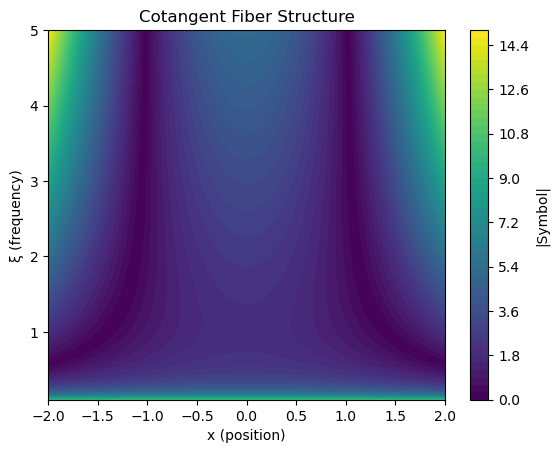

In [12]:
# Definition of variables
x, xi = symbols('x xi', real=True)
expr = (1 - x**2)*xi + 1/xi

# Instantiation of the pseudo-differential operator
p = PseudoDifferentialOperator(expr=expr, vars_x=[x], mode='symbol')

# Spatial and frequency grids for visualization
x_grid = np.linspace(-2, 2, 100)   # x ∈ [-2, 2]
xi_grid = np.linspace(0.1, 5, 100) # ξ ∈ [0.1, 5]

# Visualize the fiber at a fixed spatial point x = 0
p.visualize_fiber(x_grid=x_grid, xi_grid=xi_grid, x0=0.0)


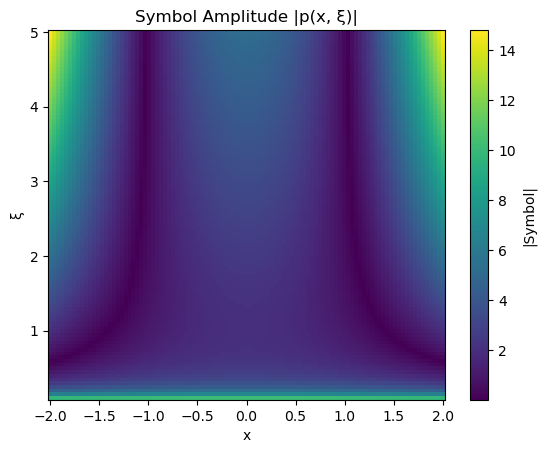

In [13]:
# Define the spatial and frequency grids
x_grid = np.linspace(-2, 2, 100)     # Spatial domain: x ∈ [-2, 2]
xi_grid = np.linspace(0.1, 5, 100)   # Frequency domain: ξ ∈ [0.1, 5]

# Visualize the amplitude of the symbol
p.visualize_symbol_amplitude(x_grid=x_grid, xi_grid=xi_grid)

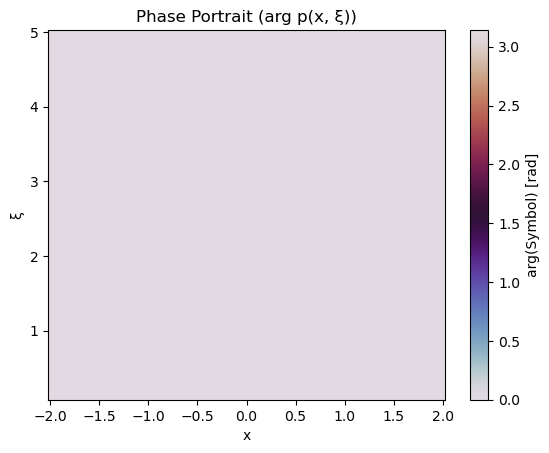

In [14]:
p.visualize_phase(
    x_grid=np.linspace(-2, 2, 100),   # Spatial grid range
    xi_grid=np.linspace(0.1, 5, 100), # Frequency grid range
    xi0=1.0                           # Fixed frequency slice for 2D if needed
)

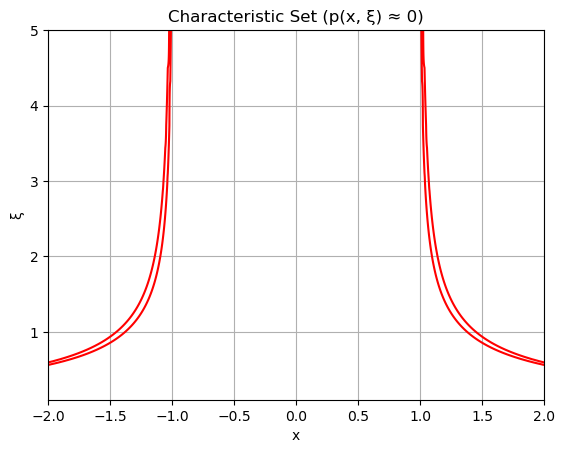

In [15]:
# Visualization grids
x_vals = np.linspace(-2, 2, 200)     # Spatial space
xi_vals = np.linspace(0.1, 5, 200)   # Frequency (ξ)

# Correct call of the method
p.visualize_characteristic_set(
    x_grid=x_vals,
    xi_grid=xi_vals
)


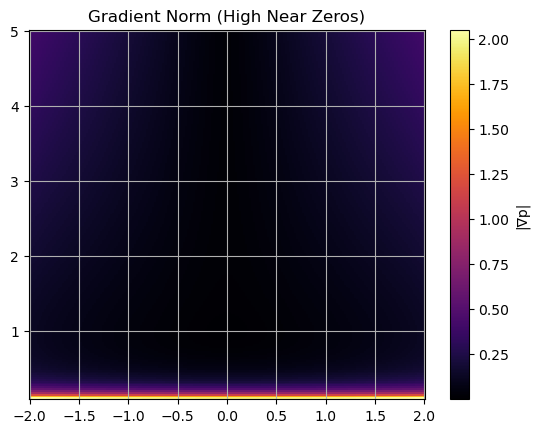

In [16]:
# Visualization grids
x_vals = np.linspace(-2, 2, 200)     # Spatial space
xi_vals = np.linspace(0.1, 5, 200)   # Frequency (ξ)

# Correct call of the method
p.visualize_characteristic_gradient(
    x_grid=x_vals,
    xi_grid=xi_vals
)

x =  x
xi =  xi


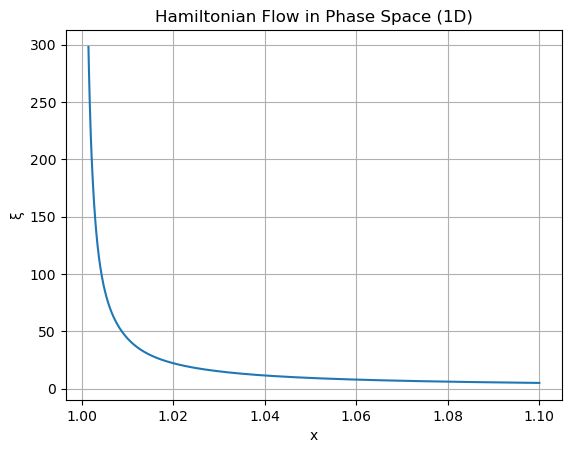

In [17]:
# Plot Hamiltonian flow in phase space
x, xi = symbols('x xi', real=True)
p.plot_hamiltonian_flow(
    x0=1.1,       # Initial position
    xi0=5.0,      # Initial momentum (frequency)
    tmax=2.0,     # Final integration time
    n_steps=200   # Number of time steps
)

x =  x
xi =  xi


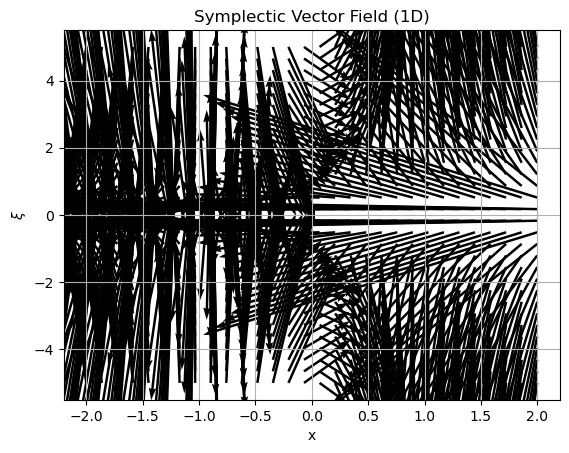

In [18]:
# Call the symplectic vector field visualization method
p.plot_symplectic_vector_field(
    xlim=(-2, 2),     # Spatial domain range
    klim=(-5, 5),     # Frequency (ξ) domain range
    density=30        # Grid resolution per axis
)

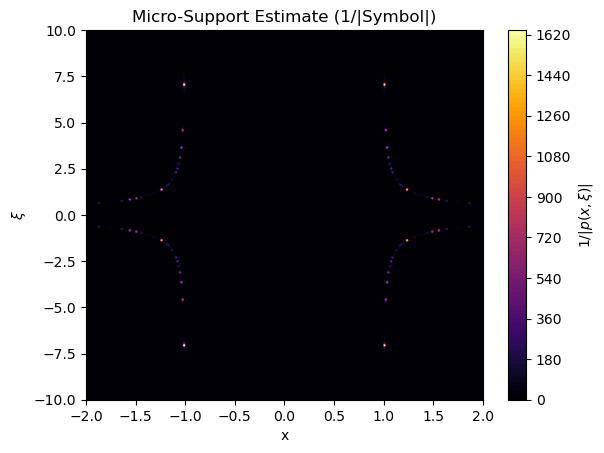

In [19]:
# Call visualize_micro_support with appropriate parameters
p.visualize_micro_support(
    xlim=(-2, 2),           # Spatial domain limits
    klim=(-10, 10),         # Frequency domain limits
    threshold=1e-3,         # Threshold for numerical stability
    density=300             # Number of grid points per axis
)

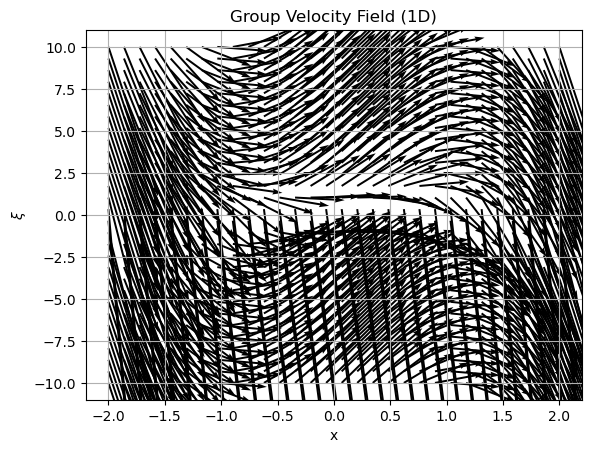

In [20]:
# Call the group_velocity_field method to visualize ∇_ξ p(x, ξ)
p.group_velocity_field(
    xlim=(-2, 2),     # Spatial domain limits
    klim=(-10, 10),   # Frequency domain limits
    density=30        # Grid resolution
)

In [21]:
# Animate singularity propagation under Hamiltonian flow
ani = p.animate_singularity(
    xi0=5.0,       # Initial frequency ξ₀
    x0=0.0,        # Initial spatial position x₀
    tmax=4.0,      # Total integration time
    n_frames=100,  # Number of animation frames
    projection='frequency'  # Choose visualization: 'phase', 'position', or 'frequency'
)

# Display the animation in Jupyter Notebook
HTML(ani.to_jshtml())

x =  x
xi =  xi
H =  {'dx/dt': -x**2 + 1 - 1/xi**2, 'dxi/dt': 2*x*xi}


### 1D interactive plottings

In [22]:
p.interactive_symbol_analysis(
                            xlim=(-2, 2),
                            xi_range=(0.1, 5),
                            density=100)


interactive(children=(Dropdown(description='Mode:', options=('Symbol Amplitude', 'Symbol Phase', 'Micro-Suppor…

### 2D basic plottings


symbol = 
            ⎛ 2    2⎞ ⎛ 2    2    ⎞
η⋅x - ξ⋅y + ⎝η  + ξ ⎠⋅⎝x  + y  + 1⎠
───────────────────────────────────
             2    2                
            η  + ξ  + 1            


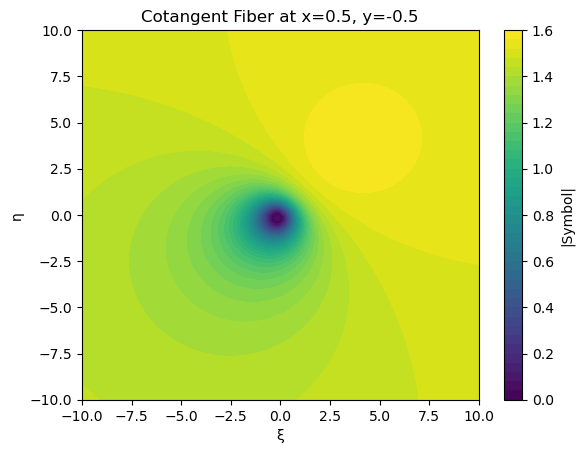

Visualizing cotangent fiber at fixed point: (x=0.5, y=-0.5)


In [23]:
# Define symbolic variables
x, y, xi, eta = symbols('x y xi eta', real=True)

# Define a 2D pseudo-differential symbol
expr_2d = ((1 + x**2 + y**2)*(xi**2 + eta**2) + x*eta - y*xi) / (1 + xi**2 + eta**2)

# Create the pseudo-differential operator in 'symbol' mode
p2d = PseudoDifferentialOperator(expr=expr_2d, vars_x=[x, y], mode='symbol')


# === New Test: visualize_fiber for 2D operator ===

# Define spatial and frequency grids
xi_vals = np.linspace(-10, 10, 200)  # Frequency grid (ξ, η)
x0 = 0.5  # Fixed x-coordinate
y0 = -0.5  # Fixed y-coordinate

# Call visualize_fiber to examine the cotangent fiber at (x0, y0)
p2d.visualize_fiber(
    x_grid=None,        # Not used in 2D
    xi_grid=xi_vals,    # Frequency grid
    x0=x0,              # Base point x-coordinate
    y0=y0               # Base point y-coordinate
)

print(f"Visualizing cotangent fiber at fixed point: (x={x0}, y={y0})")


symbol = 
            ⎛ 2    2⎞ ⎛ 2    2    ⎞
η⋅x - ξ⋅y + ⎝η  + ξ ⎠⋅⎝x  + y  + 1⎠
───────────────────────────────────
             2    2                
            η  + ξ  + 1            


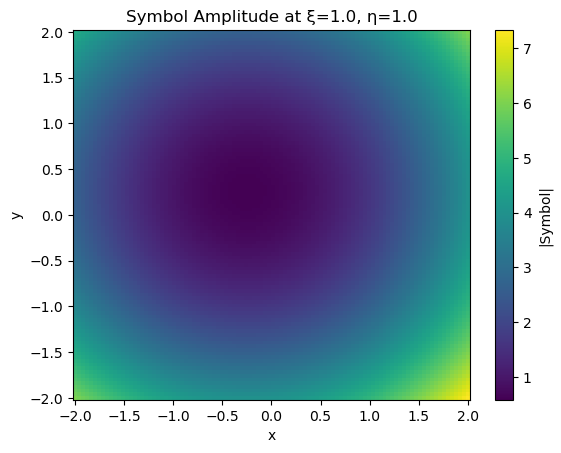

In [24]:
# Define symbolic variables
x, y, xi, eta = symbols('x y xi eta', real=True)

# Define a 2D pseudo-differential symbol
expr_2d = ((1 + x**2 + y**2)*(xi**2 + eta**2) + x*eta - y*xi) / (1 + xi**2 + eta**2)

# Create the pseudo-differential operator
p2d = PseudoDifferentialOperator(expr=expr_2d, vars_x=[x, y], mode='symbol')

# --- Visualization using visualize_symbol_amplitude ---

# Define spatial grid
x_vals = np.linspace(-2, 2, 100)
y_vals = np.linspace(-2, 2, 100)

# Define frequency grid
xi_vals = np.linspace(-5, 5, 100)
eta_vals = np.linspace(-5, 5, 100)

# Fix frequency values for 2D visualization
xi0 = 1.0
eta0 = 1.0

# Call the visualization method
p2d.visualize_symbol_amplitude(
    x_grid=x_vals,
    y_grid=y_vals,
    xi_grid=xi_vals,
    eta_grid=eta_vals,
    xi0=xi0,
    eta0=eta0
)


symbol = 
            ⎛ 2    2⎞ ⎛ 2    2    ⎞
η⋅x - ξ⋅y + ⎝η  + ξ ⎠⋅⎝x  + y  + 1⎠
───────────────────────────────────
             2    2                
            η  + ξ  + 1            


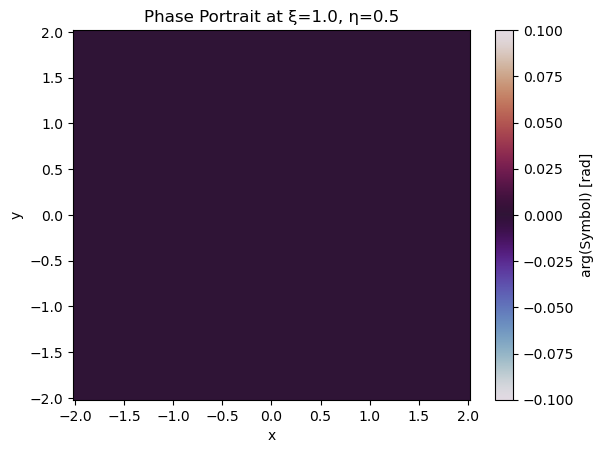

In [25]:
# Define symbolic variables
x, y, xi, eta = symbols('x y xi eta', real=True)

# Define a 2D pseudo-differential symbol (rational symbol with spatial and frequency dependence)
expr_2d = ((1 + x**2 + y**2) * (xi**2 + eta**2) + x * eta - y * xi) / (1 + xi**2 + eta**2)

# Create the pseudo-differential operator in 'symbol' mode
p2d = PseudoDifferentialOperator(expr=expr_2d, vars_x=[x, y], mode='symbol')

# --- Visualization using visualize_phase ---

# Define grids for visualization
x_vals = np.linspace(-2, 2, 100)   # Spatial grid in x
y_vals = np.linspace(-2, 2, 100)   # Spatial grid in y
xi_vals = np.linspace(-5, 5, 100)  # Frequency grid in xi
eta_vals = np.linspace(-5, 5, 100) # Frequency grid in eta

# Fixed frequency values for slicing in 2D
xi0 = 1.0
eta0 = 0.5

# Call visualize_phase with appropriate parameters
p2d.visualize_phase(
    x_grid=x_vals,
    xi_grid=xi_vals,
    y_grid=y_vals,
    eta_grid=eta_vals,  # Optional, included for API consistency
    xi0=xi0,
    eta0=eta0
)


symbol = 
            ⎛ 2    2⎞ ⎛ 2    2    ⎞
η⋅x - ξ⋅y + ⎝η  + ξ ⎠⋅⎝x  + y  + 1⎠
───────────────────────────────────
             2    2                
            η  + ξ  + 1            


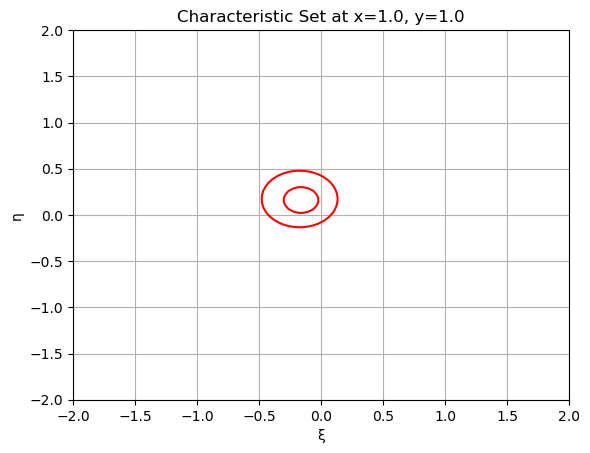

In [26]:
# Define symbolic variables
x, y, xi, eta = symbols('x y xi eta', real=True)

# Define a 2D pseudo-differential symbol
expr_2d = ((1 + x**2 + y**2)*(xi**2 + eta**2) + x*eta - y*xi) / (1 + xi**2 + eta**2)

# Instantiate the pseudo-differential operator
p2d = PseudoDifferentialOperator(expr=expr_2d, vars_x=[x, y], mode='symbol')

# --- Visualize the characteristic set ---

# Define spatial and frequency grids
x_vals = np.linspace(-2, 2, 100)     # Spatial grid in x
y_vals = np.linspace(-2, 2, 100)     # Spatial grid in y
xi_vals = np.linspace(-2, 2, 100)    # Frequency grid for ξ
eta_vals = np.linspace(-2, 2, 100)   # Frequency grid for η

# Fixed spatial point for 2D visualization
x0 = 1.0
y0 = 1.0

# Call visualize_characteristic_set
p2d.visualize_characteristic_set(
    x_grid=x_vals,
    xi_grid=xi_vals,
    eta_grid=eta_vals,
    y0=y0,
    x0=x0
)

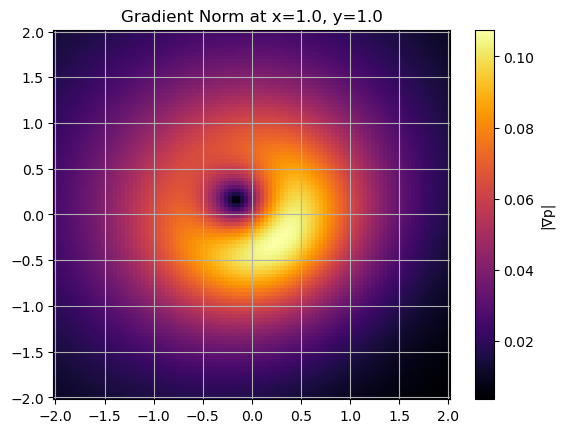

In [27]:
# Fixed spatial point for 2D visualization
x0 = 1.0
y0 = 1.0

# Call visualize_characteristic_set
p2d.visualize_characteristic_gradient(
    x_grid=x_vals,
    xi_grid=xi_vals,
    eta_grid=eta_vals,
    y0=y0,
    x0=x0
)


symbol = 
            ⎛ 2    2⎞ ⎛ 2    2    ⎞
η⋅x - ξ⋅y + ⎝η  + ξ ⎠⋅⎝x  + y  + 1⎠
───────────────────────────────────
             2    2                
            η  + ξ  + 1            

Plotting Hamiltonian flow for 2D pseudo-differential operator...


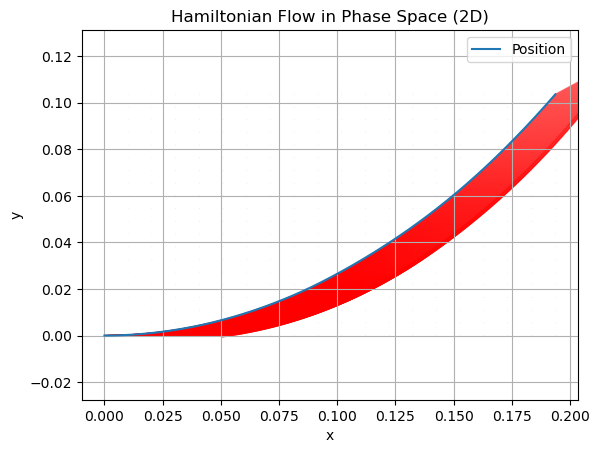

In [28]:
# Define symbolic variables
x, y, xi, eta = symbols('x y xi eta', real=True)

# Define a 2D pseudo-differential symbol
expr_2d = ((1 + x**2 + y**2)*(xi**2 + eta**2) + x*eta - y*xi) / (1 + xi**2 + eta**2)

# Create the pseudo-differential operator
p2d = PseudoDifferentialOperator(expr=expr_2d, vars_x=[x, y], mode='symbol')

# --- Plot Hamiltonian flow in phase space ---
# This visualizes how singularities propagate under the Hamiltonian dynamics
# derived from the principal symbol of the operator.

print("\nPlotting Hamiltonian flow for 2D pseudo-differential operator...")
p2d.plot_hamiltonian_flow(
    x0=0.0,      # Initial x position
    y0=0.0,      # Initial y position
    xi0=5.0,     # Initial momentum in x direction
    eta0=0.0,    # Initial momentum in y direction
    tmax=10.0,   # Total integration time
    n_steps=500  # Number of time steps
)

In [29]:
# Define symbolic variables for 2D pseudo-differential operator
x, y, xi, eta = symbols('x y xi eta', real=True)

# Define a 2D symbol expression: ((1 + x^2 + y^2)(xi^2 + eta^2) + x*eta - y*xi) / (1 + xi^2 + eta^2)
expr_2d = ((1 + x**2 + y**2)*(xi**2 + eta**2) + x*eta - y*xi) / (1 + xi**2 + eta**2)

# Instantiate the pseudo-differential operator in symbolic mode
p2d = PseudoDifferentialOperator(expr=expr_2d, vars_x=[x, y], mode='symbol')


# Animate the propagation of a singularity under the Hamiltonian flow induced by the symbol
print("\nAnimating singularity propagation...")
ani = p2d.animate_singularity(
    xi0=5.0,      # Initial frequency component along x
    eta0=0.0,     # Initial frequency component along y
    x0=0.0,       # Initial spatial position x₀
    y0=0.0,       # Initial spatial position y₀
    tmax=4.0,     # Total time of integration
    n_frames=100, # Number of frames in the animation
    projection='position'  # Projection type: 'position', 'frequency', or 'phase'
)

# Display the animation in Jupyter notebook
HTML(ani.to_jshtml())


symbol = 
            ⎛ 2    2⎞ ⎛ 2    2    ⎞
η⋅x - ξ⋅y + ⎝η  + ξ ⎠⋅⎝x  + y  + 1⎠
───────────────────────────────────
             2    2                
            η  + ξ  + 1            

Animating singularity propagation...
H =  {'dx/dt': -2*xi*(eta*x - xi*y + (eta**2 + xi**2)*(x**2 + y**2 + 1))/(eta**2 + xi**2 + 1)**2 + (2*xi*(x**2 + y**2 + 1) - y)/(eta**2 + xi**2 + 1), 'dy/dt': -2*eta*(eta*x - xi*y + (eta**2 + xi**2)*(x**2 + y**2 + 1))/(eta**2 + xi**2 + 1)**2 + (2*eta*(x**2 + y**2 + 1) + x)/(eta**2 + xi**2 + 1), 'dxi/dt': -(eta + 2*x*(eta**2 + xi**2))/(eta**2 + xi**2 + 1), 'deta/dt': -(-xi + 2*y*(eta**2 + xi**2))/(eta**2 + xi**2 + 1)}


### 2D interactive plottings

In [30]:
x, y, xi, eta = symbols('x y xi eta', real=True)

expr_2d = ((1 + x**2 + y**2)*(xi**2 + eta**2) + x*eta - y*xi) / (1 + xi**2 + eta**2)

p2d = PseudoDifferentialOperator(expr=expr_2d, vars_x=[x, y], mode='symbol')

p2d.interactive_symbol_analysis(
                            xlim=(-2, 2),
                            ylim=(-2, 2),
                            xi_range=(-2, 2),
                            eta_range=(-2, 2),
                            density=50)



symbol = 
            ⎛ 2    2⎞ ⎛ 2    2    ⎞
η⋅x - ξ⋅y + ⎝η  + ξ ⎠⋅⎝x  + y  + 1⎠
───────────────────────────────────
             2    2                
            η  + ξ  + 1            


interactive(children=(Dropdown(description='Mode:', options=('Symbol Amplitude', 'Symbol Phase', 'Micro-Suppor…

### Singularity Flow

In [31]:
x, xi = symbols('x xi', real=True)
expr = xi**3 + sin(x) * xi

op = PseudoDifferentialOperator(expr=expr, vars_x=[x], mode='symbol')
ani = op.animate_singularity(xi0=2.0, tmax=10.0)
ani


symbol = 
 3           
ξ  + ξ⋅sin(x)
x =  x
xi =  xi
H =  {'dx/dt': 3*xi**2 + sin(x), 'dxi/dt': -xi*cos(x)}


In [32]:
x, xi = symbols('x xi', real=True)
expr = xi**3 + I*sin(x) * xi

op = PseudoDifferentialOperator(expr=expr, vars_x=[x], mode='symbol')
ani = op.animate_singularity(xi0=2.0, tmax=10.0, projection='position')
ani


symbol = 
 3             
ξ  + ⅈ⋅ξ⋅sin(x)
x =  x
xi =  xi
H =  {'dx/dt': 3*xi**2 + I*sin(x), 'dxi/dt': -I*xi*cos(x)}
⚠️ The Hamiltonian field is complex. Only the real part is used for integration.


In [33]:
x, y, xi, eta = symbols('x y xi eta', real=True)
expr2d = x * eta - y * xi

op2 = PseudoDifferentialOperator(expr=expr2d, vars_x=[x, y], mode='symbol')
ani = op2.animate_singularity(xi0=2.0, eta0=0.0, projection='frequency', tmax=20)
ani


symbol = 
η⋅x - ξ⋅y
H =  {'dx/dt': -y, 'dy/dt': x, 'dxi/dt': -eta, 'deta/dt': xi}


In [34]:
x, y, xi, eta = symbols('x y xi eta', real=True)
expr2d = x * eta - y * xi

op2 = PseudoDifferentialOperator(expr=expr2d, vars_x=[x, y], mode='symbol')
ani = op2.animate_singularity(xi0=2.0, eta0=0.0, projection='phase', tmax=20)
ani


symbol = 
η⋅x - ξ⋅y
H =  {'dx/dt': -y, 'dy/dt': x, 'dxi/dt': -eta, 'deta/dt': xi}


## Order (degree of homogeneity) of the symbol

In [35]:
x, xi = symbols('x xi', real=True, positive=True)
op = PseudoDifferentialOperator(expr=xi**2, vars_x=[x], mode='symbol')
is_hom = op.is_homogeneous()
print(is_hom)
order = op.symbol_order()
print("1D Estimated order:", order)


symbol = 
 2
ξ 
(True, 2)
1D Estimated order: 2.0


In [36]:
x, xi = symbols('x xi', real=True, positive=True)
op = PseudoDifferentialOperator(expr=(x*xi)**2, vars_x=[x], mode='symbol')
is_hom = op.is_homogeneous()
print(is_hom)
order = op.symbol_order()
print("1D Estimated order:", order)


symbol = 
 2  2
x ⋅ξ 
(True, 2)
1D Estimated order: 2.0


In [37]:
x, xi = symbols('x xi', real=True, positive=True)
op = PseudoDifferentialOperator(expr=sin(x)+xi**2, vars_x=[x], mode='symbol')
is_hom = op.is_homogeneous()
print(is_hom)
order = op.symbol_order()
print("1D Estimated order:", order)


symbol = 
 2         
ξ  + sin(x)
(False, None)
⚠️ The symbol is not homogeneous. The asymptotic order is not well defined.
1D symbol_order - method 1
lead = sin(x)
power = None
coeff = 0
1D symbol_order - method 2
lead = z**(-2)
power = -2
coeff = 1
1D Estimated order: 2


In [38]:
x, xi = symbols('x xi', real=True, positive=True)

expr = exp(x*xi / (x**2 + xi**2))
op = PseudoDifferentialOperator(expr=expr, vars_x=[x], mode='symbol')
op_expanded = PseudoDifferentialOperator(expr=op.asymptotic_expansion(order=4), vars_x=[x], mode='symbol')

print("estimated order=", op.symbol_order())
print("estimated order (expanded)= ", op_expanded.symbol_order())


symbol = 
   x⋅ξ  
 ───────
  2    2
 x  + ξ 
ℯ       

symbol = 
     3     2         
  5⋅x     x     x    
- ──── + ──── + ─ + 1
     3      2   ξ    
  6⋅ξ    2⋅ξ         
⚠️ The symbol is not homogeneous. The asymptotic order is not well defined.
1D symbol_order - method 1
lead = -197063*x**9/(362880*xi**9)
power = -9
coeff = -197063*x**9/362880
⚠️ Coefficient depends on spatial variables; ignoring
1D symbol_order - method 2
lead = 1
power = None
coeff = 0
estimated order= None
⚠️ The symbol is not homogeneous. The asymptotic order is not well defined.
1D symbol_order - method 1
lead = -5*x**3/(6*xi**3)
power = -3
coeff = -5*x**3/6
⚠️ Coefficient depends on spatial variables; ignoring
1D symbol_order - method 2
lead = 1
power = None
coeff = 0
estimated order (expanded)=  None


In [39]:
# code
expr = exp(1 / xi)
op = PseudoDifferentialOperator(expr=expr, vars_x=[x], mode='symbol')
print("estimated order =", op.symbol_order())



symbol = 
 1
 ─
 ξ
ℯ 
⚠️ The symbol is not homogeneous. The asymptotic order is not well defined.
1D symbol_order - method 1
lead = 1/(362880*xi**9)
power = -9
coeff = 1/362880
⚠️ Coefficient too small (2.76e-06 < 0.001)
1D symbol_order - method 2
lead = 1
power = None
coeff = 0
estimated order = None


In [40]:
expr = xi**3
op = PseudoDifferentialOperator(expr=expr, vars_x=[x], mode='symbol')
print("estimated order =", op.symbol_order())  # ← devrait renvoyer 3



symbol = 
 3
ξ 
estimated order = 3.0


In [41]:
x, y = symbols('x y', real=True)
xi, eta = symbols('xi eta', real=True, positive=True) 
op2d = PseudoDifferentialOperator(expr=xi**2 + eta**2, vars_x=[x, y], mode='symbol')
order = op2d.symbol_order()
is_hom = op2d.is_homogeneous()
print(is_hom)
print("2D Estimated order: ", order)



symbol = 
 2    2
η  + ξ 
(True, 2)
2D Estimated order:  2.0


In [42]:
op = PseudoDifferentialOperator(expr=(xi**2 + eta**2)**(1/3), vars_x=[x, y])
is_hom = op.is_homogeneous()
print(is_hom)
print("2D Estimated order: ", op.symbol_order())


symbol = 
         0.333333333333333
⎛ 2    2⎞                 
⎝η  + ξ ⎠                 
(True, 0.666666666666667)
2D Estimated order:  0.6666666666666666


In [43]:
op = PseudoDifferentialOperator(expr=(xi**2 + eta**2 + 1)**(1/3), vars_x=[x, y])
is_hom = op.is_homogeneous()
print(is_hom)
print("2D Estimated order: ", op.symbol_order())


symbol = 
             0.333333333333333
⎛ 2    2    ⎞                 
⎝η  + ξ  + 1⎠                 
(False, None)
⚠️ The symbol is not homogeneous. The asymptotic order is not well defined.
2D symbol_order - method 1
lead = 0.00149703459976425/rho**9.0
power = -9.00000000000000
coeff = 0.00149703459976425
2D Estimated order:  -9.0


In [44]:
expr = exp(x*xi / (y**2 + eta**2))
op = PseudoDifferentialOperator(expr=expr, vars_x=[x, y], mode='symbol')

print("estimated order=", op.symbol_order(tol=0.1))


symbol = 
   x⋅ξ  
 ───────
  2    2
 η  + y 
ℯ       
⚠️ The symbol is not homogeneous. The asymptotic order is not well defined.
2D symbol_order - method 1
lead = x*(x**3*cos(theta)**3 - 12*x**2*y**2*cos(theta)**2 - 12*x**2*cos(theta)**2 + 36*x*y**4*cos(theta) + 72*x*y**2*cos(theta) + 36*x*cos(theta) - 24*y**6 - 72*y**4 - 72*y**2 - 24)*cos(theta)/(6144*rho**8*sin(theta)**8)
power = -8
coeff = x*(x**3*cos(theta)**3 - 12*x**2*y**2*cos(theta)**2 - 12*x**2*cos(theta)**2 + 36*x*y**4*cos(theta) + 72*x*y**2*cos(theta) + 36*x*cos(theta) - 24*y**6 - 72*y**4 - 72*y**2 - 24)*cos(theta)/(6144*sin(theta)**8)
⚠️ Coefficient depends on spatial variables; ignoring
2D symbol_order - method 2
lead = 1
power = None
coeff = 0
estimated order= None


In [45]:
expr = sqrt(xi**2 + eta**2)

op = PseudoDifferentialOperator(expr=expr, vars_x=[x, y], mode='symbol')
print("estimated order =", op.symbol_order())



symbol = 
   _________
  ╱  2    2 
╲╱  η  + ξ  
estimated order = 1.0


In [46]:
expr = exp(-(x**2 + y**2) / (xi**2 + eta**2))

op = PseudoDifferentialOperator(expr=expr, vars_x=[x, y], mode='symbol')
print("estimated order =", op.symbol_order(tol=1e-3))



symbol = 
    2    2
 - x  - y 
 ─────────
   2    2 
  η  + ξ  
ℯ         
⚠️ The symbol is not homogeneous. The asymptotic order is not well defined.
2D symbol_order - method 1
lead = (-2*x**6 - 6*x**4*y**2 - 6*x**2*y**4 + 3*x**2 - 2*y**6 + 3*y**2)/(768*rho**9)
power = -9
coeff = -x**6/384 - x**4*y**2/128 - x**2*y**4/128 + x**2/256 - y**6/384 + y**2/256
⚠️ Coefficient depends on spatial variables; ignoring
2D symbol_order - method 2
lead = 1
power = None
coeff = 0
estimated order = None


## Homogeneous principal symbol of the operator

In [47]:
x, xi = symbols('x xi')
xi = symbols('xi', real=True, positive=True)

expr = xi**2 + sqrt(xi**2 + x**2)
p = PseudoDifferentialOperator(expr=expr, vars_x=[x], mode='symbol')
print("Order 1:")
print(p.principal_symbol(order=1))  
print("Order 2:")
print(p.principal_symbol(order=2))



symbol = 
        _________
 2     ╱  2    2 
ξ  + ╲╱  x  + ξ  
Order 1:
xi*(xi + 1)
Order 2:
x**2/(2*xi) + xi**2 + xi


In [48]:
x, y = symbols('x y')        # 2 spatial variables
xi, eta = symbols('xi eta', real=True, positive=True)

p_ordre_1 = (xi**2 + eta**2 + 1)**(1/3)

p = PseudoDifferentialOperator(expr=p_ordre_1, vars_x=[x, y], mode='symbol')

print("Order 1:")
print(p.principal_symbol(order=1))  

print("Order 2:")
print(p.principal_symbol(order=2))  


symbol = 
             0.333333333333333
⎛ 2    2    ⎞                 
⎝η  + ξ  + 1⎠                 
Order 1:
(eta**2 + xi**2)**0.333333333333333
Order 2:
((eta**2 + xi**2)**1.0 + 0.333333333333333)/(eta**2 + xi**2)**0.666666666666667


## Asymptotic expansion

In [49]:
x, xi = symbols('x xi', real=True, positive=True)

expr = exp(x*xi / (x**2 + xi**2))
p = PseudoDifferentialOperator(expr=expr, vars_x=[x], mode='symbol')
print(p.asymptotic_expansion(order=4))


symbol = 
   x⋅ξ  
 ───────
  2    2
 x  + ξ 
ℯ       
-5*x**3/(6*xi**3) + x**2/(2*xi**2) + x/xi + 1


In [50]:
x, xi = symbols('x xi', real=True, positive=True)

p_ordre_2 = sqrt(xi**2 + 1) + x / (xi**2 + 1)
p = PseudoDifferentialOperator(expr=p_ordre_2, vars_x=[x], mode='symbol')
pprint(p.asymptotic_expansion(order=4))


symbol = 
            ________
  x        ╱  2     
────── + ╲╱  ξ  + 1 
 2                  
ξ  + 1              
            2    
       4   ξ    1
x⋅ξ + ξ  + ── - ─
           2    8
─────────────────
        3        
       ξ         


In [51]:
x, y, xi, eta = symbols('x y xi eta', real=True, positive=True)

p_ordre_1 = sqrt(xi**2 + eta**2) + x
p = PseudoDifferentialOperator(expr=p_ordre_1, vars_x=[x, y], mode='symbol')

print(p.asymptotic_expansion(order=4))



symbol = 
       _________
      ╱  2    2 
x + ╲╱  η  + ξ  
x + sqrt(eta**2 + xi**2)


In [52]:
x, y, xi, eta = symbols('x y xi eta', real=True, positive=True)

p_ordre_2 = sqrt(xi**2 + eta**2) + x / (xi**2 + eta**2)
p = PseudoDifferentialOperator(expr=p_ordre_2, vars_x=[x, y], mode='symbol')
pprint(p.asymptotic_expansion(order=4))


symbol = 
             _________
   x        ╱  2    2 
─────── + ╲╱  η  + ξ  
 2    2               
η  + ξ                
      2                        2     
     η            x           ξ      
──────────── + ─────── + ────────────
   _________    2    2      _________
  ╱  2    2    η  + ξ      ╱  2    2 
╲╱  η  + ξ               ╲╱  η  + ξ  


In [53]:
x, y, xi, eta = symbols('x y xi eta', real=True, positive=True)

expr = exp(x*xi*y*eta / (x**2 + y**2 + xi**2 + eta**2))
p = PseudoDifferentialOperator(expr=expr, vars_x=[x], mode='symbol')
print(p.asymptotic_expansion(order=4))


symbol = 
      η⋅x⋅ξ⋅y     
 ─────────────────
  2    2    2    2
 η  + x  + ξ  + y 
ℯ                 
(eta**2*x**2*xi*y**2/2 + eta*x*xi**2*y + eta*x*y*(eta**2*x**2*y**2 - 6*eta**2 - 6*x**2 - 6*y**2)/6 + xi**3)/xi**3


## Asymptotic composition

In [54]:
x, xi = symbols('x xi')
p1 = PseudoDifferentialOperator(expr=xi + x, vars_x=[x], mode='symbol')

p2 = PseudoDifferentialOperator(expr=xi + x**2, vars_x=[x], mode='symbol')

composition_1d = p1.compose_asymptotic(p2, order=2)
print("1D Asymptotic composition:")
print(composition_1d)



symbol = 
x + ξ

symbol = 
 2    
x  + ξ
1D Asymptotic composition:
1.0*(x + xi)*(x**2 + xi)


In [55]:
x, y, xi, eta = symbols('x y xi eta')
p1 = PseudoDifferentialOperator(expr=xi**2 + eta**2 + x*y, vars_x=[x, y], mode='symbol')
p2 = PseudoDifferentialOperator(expr=xi + eta + x + y, vars_x=[x, y], mode='symbol')

composition_2d = p1.compose_asymptotic(p2, order=3)
print("2D Asymptotic composition:")
print(composition_2d)



symbol = 
 2          2
η  + x⋅y + ξ 

symbol = 
η + x + ξ + y
2D Asymptotic composition:
1.0*(eta**2 + x*y + xi**2)*(eta + x + xi + y)


### Asymptotic composition & order importance

In [56]:
# Sympy Variables
x, xi = symbols('x xi', real=True)
u = Function('u')
var_u=u(x)
L = - x * diff(u(x), x) - u(x)

op = PseudoDifferentialOperator(expr=L, vars_x=[x], var_u=u(x), mode='auto')

print(op.symbol)

compose = op.compose_asymptotic(op, order=0)
print("0th order :")
pprint(expand(compose))
compose = op.compose_asymptotic(op, order=1)
print("1st order :")
pprint(expand(compose))


symbol = 
-ⅈ⋅x⋅ξ - 1
-I*x*xi - 1
0th order :
       2  2                  
- 1.0⋅x ⋅ξ  + 2.0⋅ⅈ⋅x⋅ξ + 1.0
1st order :
       2  2                  
- 1.0⋅x ⋅ξ  + 3.0⋅ⅈ⋅x⋅ξ + 1.0


## Right asymptotic inverse

In [57]:
p = PseudoDifferentialOperator(expr=xi + 1, vars_x=[x], mode='symbol')
right_inv_1d = p.right_inverse_asymptotic(order=2)
print("1D Right asymtotic inverse:")
print(right_inv_1d)
p2 = PseudoDifferentialOperator(expr=right_inv_1d, vars_x=[x], mode='symbol')
print("1D Composition rule:")
p.compose_asymptotic(p2, order=2)


symbol = 
ξ + 1
1D Right asymtotic inverse:
1/(xi + 1)

symbol = 
  1  
─────
ξ + 1
1D Composition rule:


1.00000000000000

In [58]:
p = PseudoDifferentialOperator(expr=xi + eta + 1, vars_x=[x, y], mode='symbol')
right_inv_2d = p.right_inverse_asymptotic(order=2)
print("2D Right asymtotic inverse:")
print(right_inv_2d)
p2 = PseudoDifferentialOperator(expr=right_inv_2d, vars_x=[x, y], mode='symbol')
print("2D Composition rule:")
p.compose_asymptotic(p2, order=2)


symbol = 
η + ξ + 1
2D Right asymtotic inverse:
1/(eta + xi + 1)

symbol = 
    1    
─────────
η + ξ + 1
2D Composition rule:


1.00000000000000

## Left asymptotic inverse

In [59]:
p = PseudoDifferentialOperator(expr=xi + 1, vars_x=[x], mode='symbol')
left_inv_1d = p.left_inverse_asymptotic(order=2)
print("1D Left asymtotic inverse:")
print(left_inv_1d)
p2 = PseudoDifferentialOperator(expr=left_inv_1d, vars_x=[x], mode='symbol')
print("1D Composition rule:")
p2.compose_asymptotic(p, order=2)


symbol = 
ξ + 1
1D Left asymtotic inverse:
1/(xi + 1)

symbol = 
  1  
─────
ξ + 1
1D Composition rule:


1.00000000000000

In [60]:
p = PseudoDifferentialOperator(expr=xi + eta + 1, vars_x=[x, y], mode='symbol')
left_inv_2d = p.left_inverse_asymptotic(order=3)
print("2D Left asymtotic inverse:")
print(left_inv_2d)
p2 = PseudoDifferentialOperator(expr=left_inv_2d, vars_x=[x, y], mode='symbol')
print("2D Composition rule:")
p2.compose_asymptotic(p, order=3)


symbol = 
η + ξ + 1
2D Left asymtotic inverse:
1/(eta + xi + 1)

symbol = 
    1    
─────────
η + ξ + 1
2D Composition rule:


1.00000000000000

## Ellipticity

In [61]:
x, xi = symbols('x xi', real=True)

x_vals = np.linspace(-1, 1, 100)
xi_vals = np.linspace(-10, 10, 100)

op1 = PseudoDifferentialOperator(expr=xi**2 + 1, vars_x=[x], mode='symbol')
print("1D elliptic test:", op1.is_elliptic_numerically(x_vals, xi_vals))  # True 

op2 = PseudoDifferentialOperator(expr=xi, vars_x=[x], mode='symbol')
print("1D non-elliptic test:", op2.is_elliptic_numerically(x_vals, xi_vals))  # False attendu



symbol = 
 2    
ξ  + 1
1D elliptic test: True

symbol = 
ξ
1D non-elliptic test: True


In [62]:
x_vals = np.linspace(-1, 1, 50)
y_vals = np.linspace(-1, 1, 50)
xi_vals = np.linspace(-10, 10, 50)
eta_vals = np.linspace(-10, 10, 50)

op3 = PseudoDifferentialOperator(expr=xi**2 + eta**2 + 1, vars_x=[x, y], mode='symbol')
print("2D elliptic test:", op3.is_elliptic_numerically((x_vals, y_vals), (xi_vals, eta_vals)))  # True

op4 = PseudoDifferentialOperator(expr=xi + eta, vars_x=[x, y], mode='symbol')
print("2D non-elliptic test:", op4.is_elliptic_numerically((x_vals, y_vals), (xi_vals, eta_vals)))  # False



symbol = 
 2    2    
η  + ξ  + 1
2D elliptic test: True

symbol = 
η + ξ
2D non-elliptic test: False


## $L ∘ P = Id$


symbol = 
 2    2    
x  + ξ  + 1
Left asymptotic inverse:
                                                                                      ⎛              3                           2        ⎞          ↪
                                                                                      ⎜   192.0⋅ⅈ⋅x⋅ξ       72.0⋅ⅈ⋅x⋅ξ        8⋅ξ         ⎟          ↪
                                                                                  1.0⋅⎜- ────────────── + ────────────── + ─────────── - 2⎟          ↪
                                                                                      ⎜               3                2    2    2        ⎟          ↪
                             ⎛           2                                    ⎞       ⎜  ⎛ 2    2    ⎞    ⎛ 2    2    ⎞    x  + ξ  + 1    ⎟          ↪
                             ⎜ 24.0⋅ⅈ⋅x⋅ξ         4.0⋅ⅈ⋅x            2⋅ξ      ⎟       ⎝  ⎝x  + ξ  + 1⎠    ⎝x  + ξ  + 1⎠                   ⎠          ↪
                   - 2.0⋅ⅈ⋅x⋅⎜────

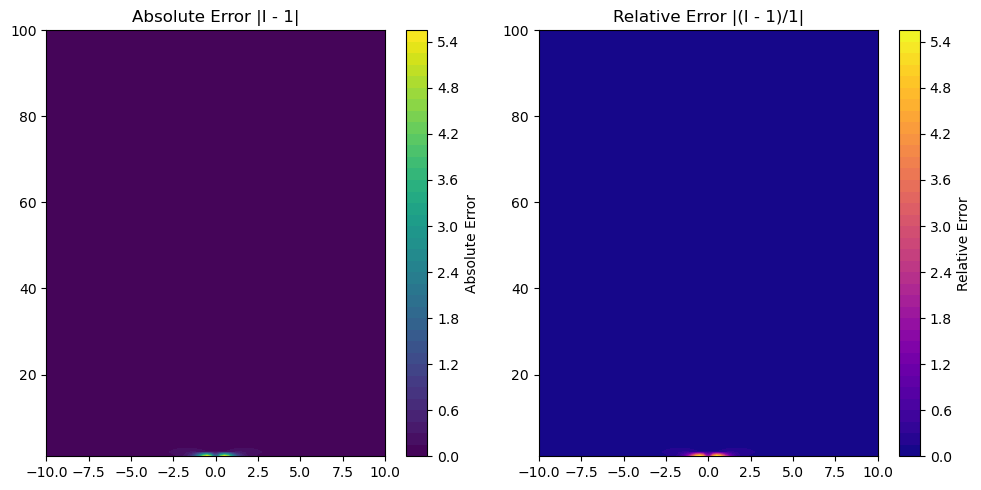

In [63]:
order = 2
# Define symbolic variables
x, xi = symbols('x xi', real=True)
u = Function('u')(x)

# Define the pseudo-differential symbol p(x, xi)
p_symbol = xi**2 + x**2 + 1

# Create the pseudo-differential operator
p = PseudoDifferentialOperator(expr=p_symbol, vars_x=[x], mode='symbol')

# Compute the left asymptotic inverse of the operator
left_inv = p.left_inverse_asymptotic(order=order)
print("Left asymptotic inverse:")
pprint(left_inv, num_columns=150)

# Create a new operator from the left inverse
p_left_inv = PseudoDifferentialOperator(expr=left_inv, vars_x=[x], mode='symbol')

# Verify the composition rule: L ∘ P ≈ I (identity operator)
composition = p_left_inv.compose_asymptotic(p, order=order)
print("Composition rule (L ∘ P):")
pprint(composition, num_columns=150)

# Simplify the result to check if it approximates the identity operator
identity_approximation = simplify(composition)
print("Simplified composition (should approximate 1):")
pprint(identity_approximation, num_columns=150)

# Development around xi -> infinity
series_expansion = series(identity_approximation, xi, oo, n=3)
print("Series expansion:", series_expansion)

# Convert to numerical function
identity_func = lambdify((x, xi), identity_approximation, 'numpy')

# Grid of points
x_vals = np.linspace(-10, 10, 100)
xi_vals = np.linspace(1, 100, 100)  # Positive frequencies
X, XI = np.meshgrid(x_vals, xi_vals, indexing='ij')

# Numerical evaluation
identity_vals = identity_func(X, XI)

absolute_error = np.abs(identity_vals - 1)
relative_error = np.abs((identity_vals - 1) / 1)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.contourf(X, XI, absolute_error, levels=50, cmap='viridis')
plt.colorbar(label='Absolute Error')
plt.title('Absolute Error |I - 1|')

plt.subplot(1, 2, 2)
plt.contourf(X, XI, relative_error, levels=50, cmap='plasma')
plt.colorbar(label='Relative Error')
plt.title('Relative Error |(I - 1)/1|')

plt.tight_layout()
plt.show()


## $P ∘ R = Id$


symbol = 
 2    2    
x  + ξ  + 1
Right asymptotic inverse:
                                                                                      ⎛            3            2                         ⎞          ↪
                                                                                      ⎜   192.0⋅ⅈ⋅x ⋅ξ       8⋅x          72.0⋅ⅈ⋅x⋅ξ      ⎟          ↪
                                                                                  1.0⋅⎜- ────────────── + ─────────── + ────────────── - 2⎟          ↪
                                                                                      ⎜               3    2    2                    2    ⎟          ↪
                             ⎛         2                                      ⎞       ⎜  ⎛ 2    2    ⎞    x  + ξ  + 1   ⎛ 2    2    ⎞     ⎟          ↪
                             ⎜ 24.0⋅ⅈ⋅x ⋅ξ          2⋅x            4.0⋅ⅈ⋅ξ    ⎟       ⎝  ⎝x  + ξ  + 1⎠                  ⎝x  + ξ  + 1⎠     ⎠          ↪
                   - 2.0⋅ⅈ⋅ξ⋅⎜───

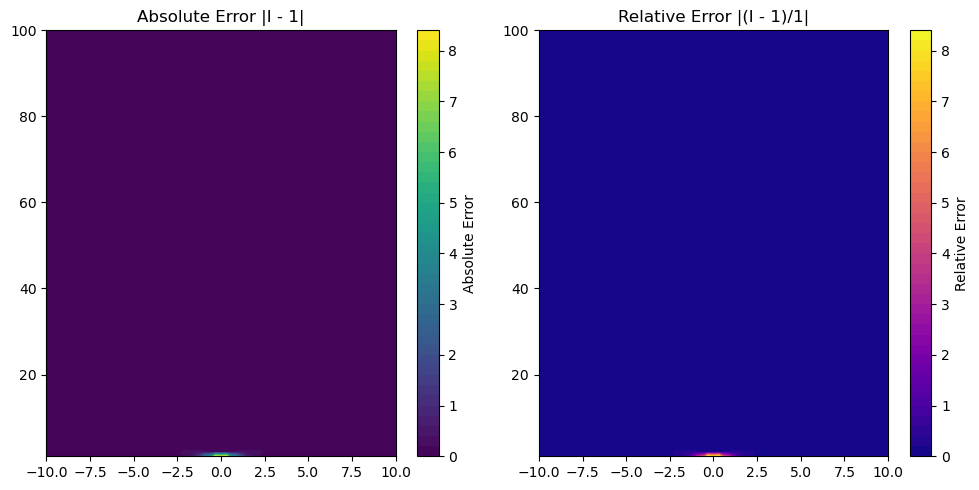

In [64]:
order = 2
# Define symbolic variables
x, xi = symbols('x xi', real=True)
u = Function('u')(x)

# Define the pseudo-differential symbol p(x, xi)
p_symbol = xi**2 + x**2 + 1

# Create the pseudo-differential operator
p = PseudoDifferentialOperator(expr=p_symbol, vars_x=[x], mode='symbol')

# Compute the left asymptotic inverse of the operator
right_inv = p.right_inverse_asymptotic(order=order)
print("Right asymptotic inverse:")
pprint(right_inv, num_columns=150)

# Create a new operator from the left inverse
p_right_inv = PseudoDifferentialOperator(expr=right_inv, vars_x=[x], mode='symbol')

# Verify the composition rule: L ∘ P ≈ I (identity operator)
composition = p.compose_asymptotic(p_right_inv, order=order)
print("Composition rule (P ∘ R ):")
pprint(composition, num_columns=150)

# Simplify the result to check if it approximates the identity operator
identity_approximation = simplify(composition)
print("Simplified composition (should approximate 1):")
pprint(identity_approximation, num_columns=150)

# Development around xi -> infinity
series_expansion = series(identity_approximation, xi, oo, n=3)
print("Series expansion:", series_expansion)

# Convert to numerical function
identity_func = lambdify((x, xi), identity_approximation, 'numpy')

# Grid of points
x_vals = np.linspace(-10, 10, 100)
xi_vals = np.linspace(1, 100, 100)  # Positive frequencies
X, XI = np.meshgrid(x_vals, xi_vals, indexing='ij')

# Numerical evaluation
identity_vals = identity_func(X, XI)

absolute_error = np.abs(identity_vals - 1)
relative_error = np.abs((identity_vals - 1) / 1)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.contourf(X, XI, absolute_error, levels=50, cmap='viridis')
plt.colorbar(label='Absolute Error')
plt.title('Absolute Error |I - 1|')

plt.subplot(1, 2, 2)
plt.contourf(X, XI, relative_error, levels=50, cmap='plasma')
plt.colorbar(label='Relative Error')
plt.title('Relative Error |(I - 1)/1|')

plt.tight_layout()
plt.show()


## Formal adjoint

### 1D

In [65]:
x, xi = symbols('x xi')
xi = symbols('xi', real=True, positive=True)
x = symbols('x', real=True, positive=True)

p_ordre_1 = xi**2
p = PseudoDifferentialOperator(expr=p_ordre_1, vars_x=[x], mode='symbol')
print(p.formal_adjoint())  
print(p.is_self_adjoint())


symbol = 
 2
ξ 
xi**2
True


In [66]:
# Declaration of variables
x, xi = symbols('x xi', real=True)
xi = symbols('xi', real=True, positive=True)
x = symbols('x', real=True)

# Complex symbol depending on x and xi
p_expr = (1 + I * x) * xi + exp(-x) / xi

# Creation of the pseudo-differential operator
p = PseudoDifferentialOperator(expr=p_expr, vars_x=[x], mode='symbol')

# Calculation of the formal adjoint
adjoint = p.formal_adjoint()
print("Formal adjoint (1D):")
print(adjoint)

# Self-adjointness test
print("Is self-adjoint (1D)?", p.is_self_adjoint())



symbol = 
               -x
              ℯ  
ξ⋅(ⅈ⋅x + 1) + ───
               ξ 
Formal adjoint (1D):
-I*x*xi + xi + exp(-x)/xi
Is self-adjoint (1D)? False


### 2D

In [67]:
xi, eta = symbols('xi eta', real=True, positive=True)
x, y = symbols('x y', real=True, positive=True)

p_ordre_1 = xi**2 + eta**2
p = PseudoDifferentialOperator(expr=p_ordre_1, vars_x=[x, y], mode='symbol')
print(p.formal_adjoint())  

print(p.is_self_adjoint())





symbol = 
 2    2
η  + ξ 
eta**2 + xi**2
True


In [68]:
xi, eta = symbols('xi eta', real=True, positive=True)
x, y = symbols('x y', real=True, positive=True)

p_ordre_1 = y * xi**2 + x * eta**2
p = PseudoDifferentialOperator(expr=p_ordre_1, vars_x=[x, y], mode='symbol')
print(p.formal_adjoint())  

print(p.is_self_adjoint())



symbol = 
 2      2  
η ⋅x + ξ ⋅y
eta**2*x + xi**2*y
True


In [69]:
# Declaration of variables
x, y, xi, eta = symbols('x y xi eta', real=True)
xi = symbols('xi', real=True, positive=True)
eta = symbols('eta', real=True, positive=True)
x, y = symbols('x y', real=True)

# Complex symbol in 2D
p_expr_2d = (x + I*y)*xi + (y - I*x)*eta + exp(-x - y)/(xi + eta)

# Creation of the 2D operator
p2 = PseudoDifferentialOperator(expr=p_expr_2d, vars_x=[x, y], mode='symbol')

# Calculation of the adjoint
adjoint_2d = p2.formal_adjoint()
print("Formal adjoint (2D):")
print(adjoint_2d)

# Self-adjointness test
print("Is self-adjoint (2D)?", p2.is_self_adjoint())

p2.interactive_symbol_analysis(
                            xlim=(-10, 10),
                            ylim=(-10, 10),
                            xi_range=(0, 10),
                            eta_range=(0, 10),
                            density=50)



symbol = 
                              -x - y
                             ℯ      
η⋅(-ⅈ⋅x + y) + ξ⋅(x + ⅈ⋅y) + ───────
                              η + ξ 
Formal adjoint (2D):
((eta + xi)*(eta*(I*x + y) + xi*(x - I*y))*exp(x + y) + 1)*exp(-x - y)/(eta + xi)
Is self-adjoint (2D)? False


interactive(children=(Dropdown(description='Mode:', options=('Symbol Amplitude', 'Symbol Phase', 'Micro-Suppor…